In [ ]:
from sklearn.preprocessing import StandardScaler    
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
df=pd.read_csv('/content/Dataset.csv')

In [ ]:
df

,stateabb,ccode_x,year,milex,milper,irst,pec,tpop,upop,cinc,ccode_y,statename,imports,exports,AtWar
0,USA,2,1870,13128,50,1692,37779,39905,4130,0.099000,2,United States of America,450.000000,418.000000,0
1,USA,2,1871,11811,42,1735,39546,40938,4302,0.098381,2,United States of America,534.000000,475.000000,0
2,USA,2,1872,14246,42,2590,48479,41972,4481,0.115283,2,United States of America,632.000000,474.000000,0
3,USA,2,1873,15014,43,2602,53674,43006,4667,0.116269,2,United States of America,342.029999,626.590027,0
4,USA,2,1874,12899,44,2439,51736,44040,4862,0.114245,2,United States of America,576.000000,619.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12235,WSM,990,2008,0,0,0,39,183,0,0.000005,990,Samoa,374.716258,153.254112,0
12236,WSM,990,2009,0,0,0,38,185,0,0.000005,990,Samoa,340.987174,120.319739,0
12237,WSM,990,2010,0,0,0,38,186,0,0.000005,990,Samoa,461.134529,134.037925,0
12238,WSM,990,2011,0,0,0,38,187,0,0.000005,990,Samoa,493.031345,138.232471,0


In [ ]:
df.statename.unique()

array(['United States of America', 'Canada', 'Bahamas', 'Cuba', 'Haiti',
       'Dominican Republic', 'Jamaica', 'Trinidad and Tobago', 'Barbados',
       'Dominica', 'Grenada', 'St. Lucia',
       'St. Vincent and the Grenadines', 'St. Kitts and Nevis', 'Mexico',
       'Belize', 'Guatemala', 'Honduras', 'El Salvador', 'Nicaragua',
       'Costa Rica', 'Panama', 'Colombia', 'Venezuela', 'Guyana',
       'Suriname', 'Ecuador', 'Peru', 'Brazil', 'Bolivia', 'Paraguay',
       'Chile', 'Argentina', 'Uruguay', 'United Kingdom', 'Ireland',
       'Netherlands', 'Belgium', 'Luxembourg', 'France', 'Switzerland',
       'Spain', 'Portugal', 'Germany', 'German Federal Republic',
       'German Democratic Republic', 'Poland', 'Austria-Hungary',
       'Austria', 'Hungary', 'Czechoslovakia', 'Czech Republic',
       'Slovakia', 'Italy', 'Malta', 'Albania', 'Montenegro', 'Macedonia',
       'Croatia', 'Yugoslavia', 'Bosnia and Herzegovina', 'Slovenia',
       'Greece', 'Cyprus', 'Bulgaria', 'Moldo

In [ ]:
# creating initial dataframe
statename_types = ('United States of America', 'Canada', 'Bahamas', 'Cuba', 'Haiti',
       'Dominican Republic', 'Jamaica', 'Trinidad and Tobago', 'Barbados',
       'Dominica', 'Grenada', 'St. Lucia',
       'St. Vincent and the Grenadines', 'St. Kitts and Nevis', 'Mexico',
       'Belize', 'Guatemala', 'Honduras', 'El Salvador', 'Nicaragua',
       'Costa Rica', 'Panama', 'Colombia', 'Venezuela', 'Guyana',
       'Suriname', 'Ecuador', 'Peru', 'Brazil', 'Bolivia', 'Paraguay',
       'Chile', 'Argentina', 'Uruguay', 'United Kingdom', 'Ireland',
       'Netherlands', 'Belgium', 'Luxembourg', 'France', 'Switzerland',
       'Spain', 'Portugal', 'Germany', 'German Federal Republic',
       'German Democratic Republic', 'Poland', 'Austria-Hungary',
       'Austria', 'Hungary', 'Czechoslovakia', 'Czech Republic',
       'Slovakia', 'Italy', 'Malta', 'Albania', 'Montenegro', 'Macedonia',
       'Croatia', 'Yugoslavia', 'Bosnia and Herzegovina', 'Slovenia',
       'Greece', 'Cyprus', 'Bulgaria', 'Moldova', 'Romania', 'Russia',
       'Estonia', 'Latvia', 'Lithuania', 'Ukraine', 'Belarus', 'Armenia',
       'Georgia', 'Azerbaijan', 'Finland', 'Sweden', 'Norway', 'Denmark',
       'Iceland', 'Sao Tome and Principe', 'Guinea-Bissau',
       'Equatorial Guinea', 'Gambia', 'Mali', 'Senegal', 'Benin',
       'Mauritania', 'Niger', 'Ivory Coast', 'Guinea', 'Burkina Faso',
       'Liberia', 'Sierra Leone', 'Ghana', 'Togo', 'Cameroon', 'Nigeria',
       'Gabon', 'Central African Republic', 'Chad', 'Congo',
       'Democratic Republic of the Congo', 'Uganda', 'Kenya', 'Tanzania',
       'Burundi', 'Rwanda', 'Somalia', 'Djibouti', 'Ethiopia', 'Angola',
       'Mozambique', 'Zambia', 'Zimbabwe', 'Malawi', 'South Africa',
       'Madagascar', 'Comoros', 'Mauritius', 'Seychelles', 'Morocco',
       'Algeria', 'Tunisia', 'Libya', 'Sudan', 'Iran', 'Turkey', 'Iraq',
       'Egypt', 'Syria', 'Lebanon', 'Jordan', 'Israel', 'Saudi Arabia',
       'Yemen Arab Republic', 'Yemen', "Yemen People's Republic",
       'Kuwait', 'Bahrain', 'Qatar', 'United Arab Emirates', 'Oman',
       'Afghanistan', 'Turkmenistan', 'Tajikistan', 'Kyrgyzstan',
       'Uzbekistan', 'Kazakhstan', 'China', 'Mongolia', 'Taiwan', 'Korea',
       'North Korea', 'South Korea', 'Japan', 'India', 'Pakistan',
       'Bangladesh', 'Myanmar', 'Sri Lanka', 'Maldives', 'Nepal',
       'Thailand', 'Cambodia', 'Laos', 'Vietnam', 'Republic of Vietnam',
       'Malaysia', 'Singapore', 'Brunei', 'Philippines', 'Indonesia',
       'Australia', 'Papua New Guinea', 'New Zealand', 'Vanuatu',
       'Solomon Islands', 'Fiji', 'Tonga', 'Samoa')
state_df = pd.DataFrame(statename_types, columns=['statename_types'])
# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in another column
state_df['State_Types_Cat'] = labelencoder.fit_transform(state_df['statename_types'])
state_df

,statename_types,State_Types_Cat
0,United States of America,170
1,Canada,27
2,Bahamas,10
3,Cuba,37
4,Haiti,68
...,...,...
177,Vanuatu,173
178,Solomon Islands,142
179,Fiji,52
180,Tonga,161


In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
state_df

,statename_types,State_Types_Cat
0,United States of America,170
1,Canada,27
2,Bahamas,10
3,Cuba,37
4,Haiti,68
5,Dominican Republic,45
6,Jamaica,80
7,Trinidad and Tobago,162
8,Barbados,13
9,Dominica,44


In [ ]:
x=df.loc[:,'stateabb':'exports']

In [ ]:
x

,stateabb,ccode_x,year,milex,milper,irst,pec,tpop,upop,cinc,ccode_y,statename,imports,exports
0,USA,2,1870,13128,50,1692,37779,39905,4130,0.099000,2,United States of America,4.500000e+02,4.180000e+02
1,USA,2,1871,11811,42,1735,39546,40938,4302,0.098381,2,United States of America,5.340000e+02,4.750000e+02
2,USA,2,1872,14246,42,2590,48479,41972,4481,0.115283,2,United States of America,6.320000e+02,4.740000e+02
3,USA,2,1873,15014,43,2602,53674,43006,4667,0.116269,2,United States of America,3.420300e+02,6.265900e+02
4,USA,2,1874,12899,44,2439,51736,44040,4862,0.114245,2,United States of America,5.760000e+02,6.190000e+02
5,USA,2,1875,11720,38,2057,52194,45073,5064,0.106965,2,United States of America,5.330000e+02,5.450600e+02
6,USA,2,1876,10749,41,1899,51080,46107,5275,0.101917,2,United States of America,4.690000e+02,5.650000e+02
7,USA,2,1877,9074,34,2100,56754,47141,5495,0.104653,2,United States of America,4.660000e+02,6.320000e+02
8,USA,2,1878,11367,36,2338,55588,48174,5724,0.108345,2,United States of America,4.530000e+02,7.200000e+02
9,USA,2,1879,10527,38,2786,67742,49208,5962,0.120333,2,United States of America,4.610000e+02,7.300000e+02


In [ ]:
type(x)

pandas.core.frame.DataFrame

In [ ]:
y=df.loc[:,'AtWar']

In [ ]:
y

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       1
29       0
30       1
31       0
32       0
33       0
34       0
35       0
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       1
48       1
49       0
50       0
51       0
52       0
53       0
54       0
55       0
56       0
57       0
58       0
59       0
60       0
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       1
72       1
73       1
74       1
75       1
76       0
77       0
78       0
79       0
80       1
81       1
82       1
83       1
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [ ]:
type(y)

pandas.core.series.Series

In [ ]:
y=y.to_frame()

In [ ]:
type(y)

pandas.core.frame.DataFrame

In [ ]:
x.shape

(12240, 14)

In [ ]:
y.shape

(12240, 1)

In [ ]:
x1_np= x.to_numpy()

In [ ]:
y1_np=y.to_numpy()

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(x1_np, y1_np, test_size=0.3, random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(8568, 14)
(3672, 14)
(8568, 1)
(3672, 1)


In [ ]:
import torch
from torch import nn, optim

In [ ]:
x_train_tensor = torch.from_numpy(X_train).float()
y_train_tensor = torch.from_numpy(Y_train).float()

TypeError: ignored

In [ ]:
new_df = pd.read_csv('/content/new_dataset.csv')

In [ ]:
new_df.isna().sum()

ccode_x      0
year         0
milex        0
milper       0
irst         0
pec          0
tpop         0
upop         0
cinc         0
ccode_y      0
statename    0
imports      0
exports      1
AtWar        0
dtype: int64

In [ ]:
new_df=new_df.dropna(axis=0, how='any')


In [ ]:
new_df

,ccode_x,year,milex,milper,irst,pec,tpop,upop,cinc,ccode_y,statename,imports,exports,AtWar
0,2,1870,13128,50,1692,37779,39905,4130,0.099000,2,170,4.500000e+02,4.180000e+02,0
1,2,1871,11811,42,1735,39546,40938,4302,0.098381,2,170,5.340000e+02,4.750000e+02,0
2,2,1872,14246,42,2590,48479,41972,4481,0.115283,2,170,6.320000e+02,4.740000e+02,0
3,2,1873,15014,43,2602,53674,43006,4667,0.116269,2,170,3.420300e+02,6.265900e+02,0
4,2,1874,12899,44,2439,51736,44040,4862,0.114245,2,170,5.760000e+02,6.190000e+02,0
5,2,1875,11720,38,2057,52194,45073,5064,0.106965,2,170,5.330000e+02,5.450600e+02,0
6,2,1876,10749,41,1899,51080,46107,5275,0.101917,2,170,4.690000e+02,5.650000e+02,0
7,2,1877,9074,34,2100,56754,47141,5495,0.104653,2,170,4.660000e+02,6.320000e+02,0
8,2,1878,11367,36,2338,55588,48174,5724,0.108345,2,170,4.530000e+02,7.200000e+02,0
9,2,1879,10527,38,2786,67742,49208,5962,0.120333,2,170,4.610000e+02,7.300000e+02,0


In [ ]:
xx = new_df.loc[:,'ccode_x':'exports']

In [ ]:
yy= new_df.loc[:,'AtWar']

In [ ]:
type(yy)

pandas.core.series.Series

In [ ]:
yy=yy.to_frame()

In [ ]:
type(yy)

pandas.core.frame.DataFrame

In [ ]:
xx1_np= xx.to_numpy()

In [ ]:
yy1_np= yy.to_numpy()

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(xx1_np, yy1_np, test_size=0.3, random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(8567, 13)
(3672, 13)
(8567, 1)
(3672, 1)


In [ ]:
x_train_tensor = torch.from_numpy(X_train).float()
y_train_tensor = torch.from_numpy(Y_train).float()

In [ ]:
x_test_tensor = torch.tensor(X_test, dtype=torch.float)
y_test_tensor = torch.tensor(Y_test, dtype=torch.float)

In [ ]:
type(x_train_tensor)
type(y_train_tensor)

torch.Tensor

In [ ]:
type(x_test_tensor)
type(y_test_tensor)

torch.Tensor

In [ ]:
if torch.cuda.is_available:
  print('Good to go!')
else:
  print('Please set GPU via Edit -> Notebook Settings.')

Good to go!


In [ ]:
from sklearn.preprocessing import StandardScaler    
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(xx, yy, test_size=0.33, random_state=69)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [ ]:
X_train

array([[-0.36442641, -0.83317514, -0.14253523, ..., -1.56246395,
        -0.1922884 , -0.20289116],
       [ 0.61288417,  0.93387617, -0.14189347, ...,  0.16040416,
        -0.18770769, -0.19891046],
       [ 1.78329241,  0.05035051, -0.13910977, ..., -0.29902734,
        -0.18892667, -0.1969701 ],
       ...,
       [ 1.34980788, -0.6189871 , -0.01724642, ..., -0.14588351,
        -0.18460766, -0.19314534],
       [-0.67968789, -2.17185038, -0.14302271, ...,  1.25155396,
        -0.19223121, -0.20241618],
       [ 0.16363657,  0.90710266, -0.13957479, ..., -1.25617629,
        -0.18623265, -0.20147979]])

In [ ]:
y_train = y_train.values
y_train

array([[0],
       [0],
       [0],
       ...,
       [1],
       [0],
       [0]])

In [ ]:
X_train.shape

(8200, 13)

In [ ]:
y_train.shape

(8200, 1)

In [ ]:
type(X_train)

numpy.ndarray

In [ ]:
type(y_train)

numpy.ndarray

In [ ]:
EPOCHS = 50
BATCH_SIZE = 64
LEARNING_RATE = 0.05

In [ ]:
## train data
class trainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)


train_data = trainData(torch.FloatTensor(X_train),torch.FloatTensor(y_train))
## test data    
class testData(Dataset):
    
    def __init__(self, X_data):
        self.X_data = X_data
        
    def __getitem__(self, index):
        return self.X_data[index]
        
    def __len__ (self):
        return len(self.X_data)
    

test_data = testData(torch.FloatTensor(X_test))

In [ ]:
train_loader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=1)

In [ ]:
class binaryClassification(nn.Module):
    def __init__(self):
        super(binaryClassification, self).__init__()
        # Number of input features is 13.
        self.layer_1 = nn.Linear(13, 64) 
        self.layer_2 = nn.Linear(64, 64)
        self.layer_out = nn.Linear(64, 1) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.1)
        self.batchnorm1 = nn.BatchNorm1d(64)
        self.batchnorm2 = nn.BatchNorm1d(64)
        
    def forward(self, inputs):
        x = self.relu(self.layer_1(inputs))
        x = self.batchnorm1(x)
        x = self.relu(self.layer_2(x))
        x = self.batchnorm2(x)
        x = self.dropout(x)
        x = self.layer_out(x)
        
        return x

In [ ]:
device = torch.device("cuda:0" )
print(device)

cuda:0


In [ ]:
model = binaryClassification()
model.to(device)
print(model)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

binaryClassification(
  (layer_1): Linear(in_features=13, out_features=64, bias=True)
  (layer_2): Linear(in_features=64, out_features=64, bias=True)
  (layer_out): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.1, inplace=False)
  (batchnorm1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


In [ ]:
def binary_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))

    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc = correct_results_sum/y_test.shape[0]
    acc = torch.round(acc * 100)
    
    return acc

In [ ]:
model.train()
for e in range(1, EPOCHS+1):
    epoch_loss = 0
    epoch_acc = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        
        y_pred = model(X_batch)
        
        loss = criterion(y_pred, y_batch)
        acc = binary_acc(y_pred, y_batch)
        
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        epoch_acc += acc.item()
        

    print(f'Epoch {e+0:03}: | Loss: {epoch_loss/len(train_loader):.5f} | Acc: {epoch_acc/len(train_loader):.3f}')

Epoch 001: | Loss: 0.19288 | Acc: 94.512
Epoch 002: | Loss: 0.14823 | Acc: 95.636
Epoch 003: | Loss: 0.14809 | Acc: 95.705
Epoch 004: | Loss: 0.14327 | Acc: 95.822
Epoch 005: | Loss: 0.14091 | Acc: 95.884
Epoch 006: | Loss: 0.14647 | Acc: 95.674
Epoch 007: | Loss: 0.14411 | Acc: 95.806
Epoch 008: | Loss: 0.14093 | Acc: 95.659
Epoch 009: | Loss: 0.13970 | Acc: 95.868
Epoch 010: | Loss: 0.13817 | Acc: 95.791
Epoch 011: | Loss: 0.13951 | Acc: 95.884
Epoch 012: | Loss: 0.13657 | Acc: 95.829
Epoch 013: | Loss: 0.13647 | Acc: 95.868
Epoch 014: | Loss: 0.13693 | Acc: 95.845
Epoch 015: | Loss: 0.14260 | Acc: 95.814
Epoch 016: | Loss: 0.13468 | Acc: 95.930
Epoch 017: | Loss: 0.13130 | Acc: 96.008
Epoch 018: | Loss: 0.13467 | Acc: 96.047
Epoch 019: | Loss: 0.13302 | Acc: 96.031
Epoch 020: | Loss: 0.13170 | Acc: 95.899
Epoch 021: | Loss: 0.13286 | Acc: 95.899
Epoch 022: | Loss: 0.13421 | Acc: 95.876
Epoch 023: | Loss: 0.13251 | Acc: 96.116
Epoch 024: | Loss: 0.13267 | Acc: 95.922
Epoch 025: | Los

In [ ]:
y_pred_list = []
model.eval()
with torch.no_grad():
    for X_batch in test_loader:
        X_batch = X_batch.to(device)
        y_test_pred = model(X_batch)
        y_test_pred = torch.sigmoid(y_test_pred)
        y_pred_tag = torch.round(y_test_pred)
        y_pred_list.append(y_pred_tag.cpu().numpy())

y_pred_list = [a.squeeze().tolist() for a in y_pred_list]

In [ ]:
confusion_matrix(y_test, y_pred_list)

array([[3877,    7],
       [ 133,   22]])

In [ ]:
model.eval()

binaryClassification(
  (layer_1): Linear(in_features=13, out_features=64, bias=True)
  (layer_2): Linear(in_features=64, out_features=64, bias=True)
  (layer_out): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.1, inplace=False)
  (batchnorm1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

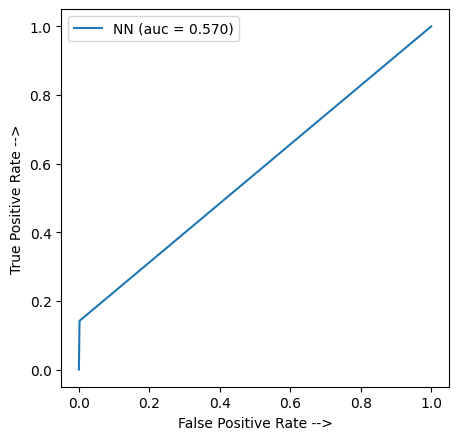

In [ ]:
from sklearn.metrics import roc_curve, auc
nn_fpr, nn_tpr, threshold = roc_curve(y_test, y_pred_list)
auc_nn = auc(nn_fpr, nn_tpr)

plt.figure(figsize=(5, 5), dpi=100)
plt.plot(nn_fpr, nn_tpr, linestyle='-', label='NN (auc = %0.3f)' % auc_nn)
#plt.plot(logistic_fpr, logistic_tpr, marker='.', label='Logistic (auc = %0.3f)' % auc_logistic)

plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')

plt.legend()

plt.show()